In [2]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage.util import random_noise
from skimage import exposure

## True Color Index_10m

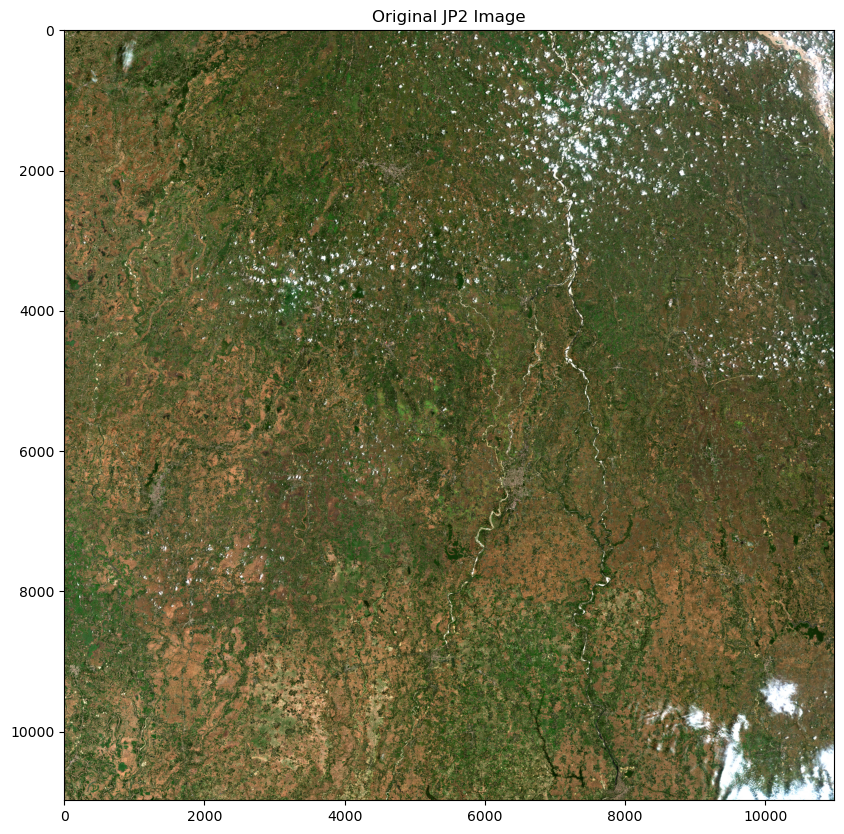

In [26]:
image_path = '/home/fahim/Downloads/S2A_MSIL1C_20240707T043701_N0510_R033_T45RXJ_20240707T071125 (2).SAFE/new satellite image dinajpur/S2B_MSIL2A_20240602T043659_N0510_R033_T45RXJ_20240602T065959.SAFE/GRANULE/L2A_T45RXJ_A037811_20240602T044729/IMG_DATA/R10m/T45RXJ_20240602T043659_TCI_10m.jp2'
with rasterio.open(image_path) as src:
    image = src.read()

plt.figure(figsize=(10, 10))
plt.imshow(image.transpose(1, 2, 0))
plt.title('Original JP2 Image')
plt.show()

In [3]:
image = image.astype(np.float32) / 255.0
print("Image range after normalization:", image.min(), image.max())

Image range after normalization: 0.0 1.0


Metadata: {'driver': 'JP2OpenJPEG', 'dtype': 'uint8', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 3, 'crs': CRS.from_epsg(32645), 'transform': Affine(10.0, 0.0, 600000.0,
       0.0, -10.0, 2900040.0)}


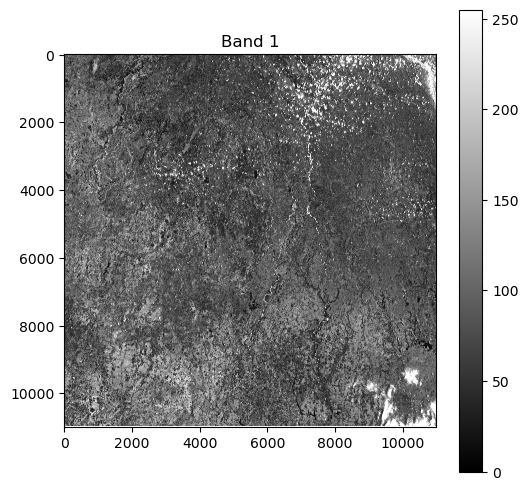

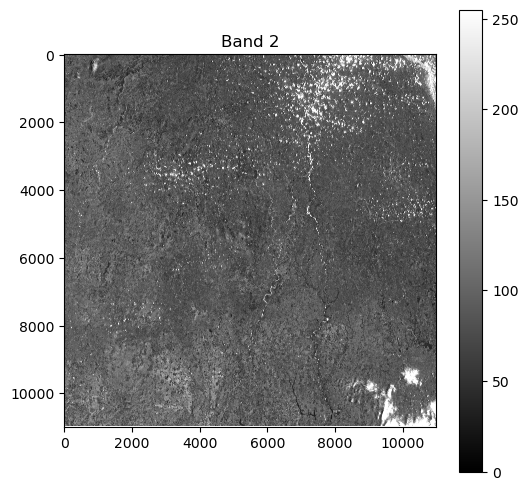

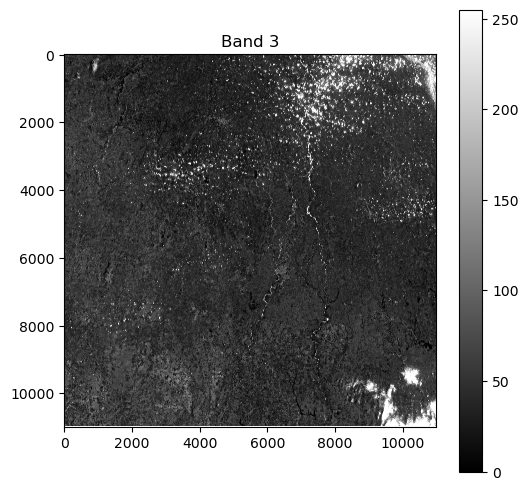

In [4]:
with rasterio.open(image_path) as src:
    metadata = src.meta
    print("Metadata:", metadata)

    for band in range(1, src.count + 1):
        band_data = src.read(band)
        plt.figure(figsize=(6, 6))
        plt.imshow(band_data, cmap='gray')
        plt.title(f'Band {band}')
        plt.colorbar()
        plt.show()

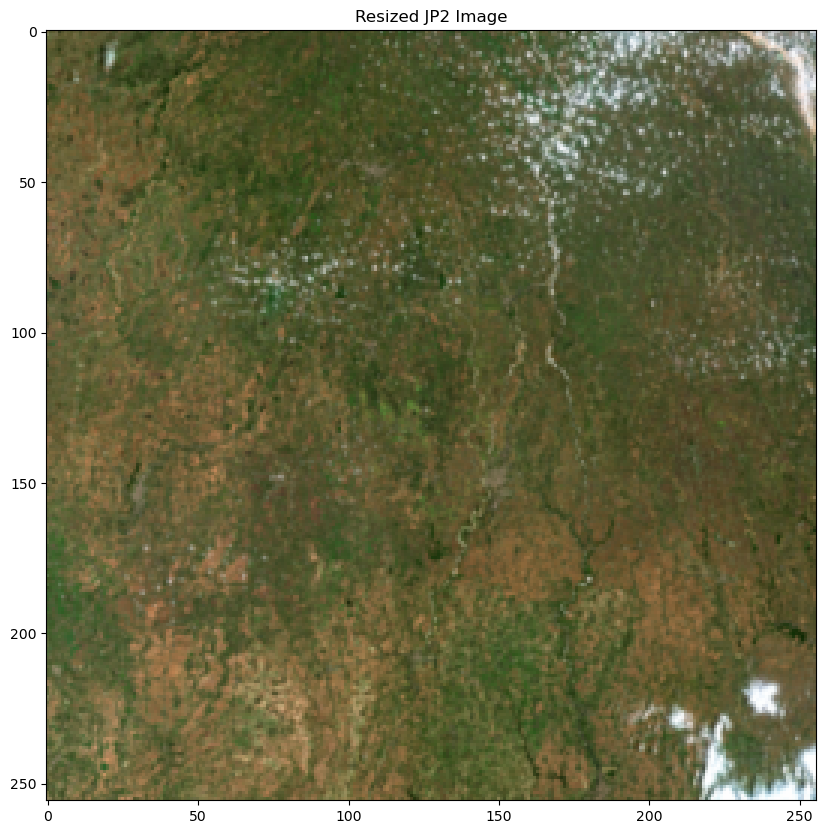

In [5]:
def resize_image_skimage(image, size=(256, 256)):
    bands, height, width = image.shape
    resized_image = np.zeros((bands, size[0], size[1]), dtype=image.dtype)
    for i in range(bands):
        resized_image[i] = resize(image[i], size, anti_aliasing=True)
    return resized_image

image_resized = resize_image_skimage(image, size=(256, 256))
plt.figure(figsize=(10, 10))
plt.imshow(image_resized.transpose(1, 2, 0))
plt.title('Resized JP2 Image')
plt.show()

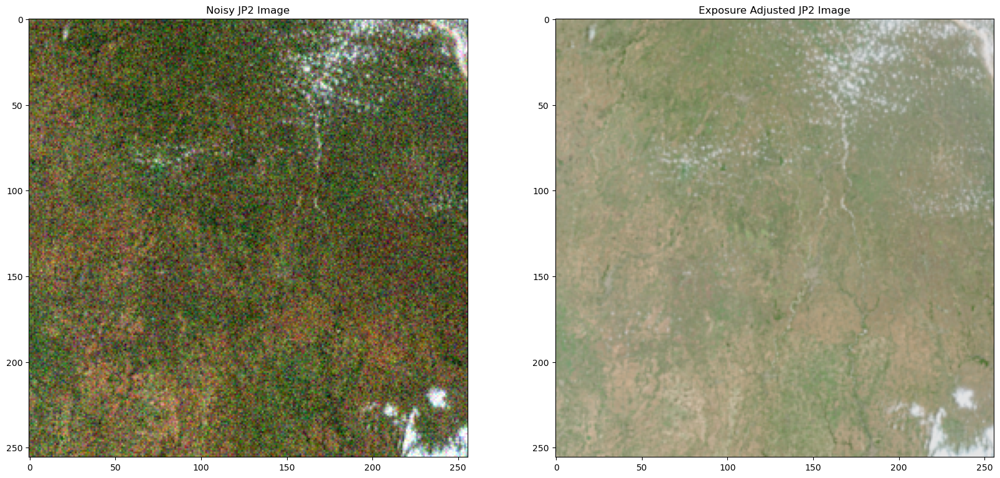

In [6]:
image_noisy = random_noise(image_resized)
image_exposure = exposure.adjust_gamma(image_resized, gamma=0.4, gain=0.9)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image_noisy.transpose(1, 2, 0))
ax[0].set_title('Noisy JP2 Image')
ax[1].imshow(image_exposure.transpose(1, 2, 0))
ax[1].set_title('Exposure Adjusted JP2 Image')
plt.show()

In [7]:
image_flattened = image_resized.reshape(-1, 256*256*image_resized.shape[0])
X_train, X_test, y_train, y_test = image_flattened, image_flattened, [0], [0]

## 10m Single photo test train

In [8]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", len(y_train))
print("y_test shape:", len(y_test))

X_train shape: (1, 196608)
X_test shape: (1, 196608)
y_train shape: 1
y_test shape: 1


## True Color Index_10m

In [32]:
from sklearn.model_selection import train_test_split

In [34]:
def load_image(file_path):
    with rasterio.open(file_path) as src:
        image_1 = src.read()
    return image_1

In [35]:
def extract_patches(image_1, patch_size=(256, 256)):
    patches = []
    height, width = image.shape[1], image.shape[2]
    for i in range(0, height, patch_size[0]):
        for j in range(0, width, patch_size[1]):
            patch = image[:, i:i+patch_size[0], j:j+patch_size[1]]
            if patch.shape[1] == patch_size[0] and patch.shape[2] == patch_size[1]:
                patches.append(patch)
    return np.array(patches)

In [36]:
file_path = '/home/fahim/Downloads/S2A_MSIL1C_20240707T043701_N0510_R033_T45RXJ_20240707T071125 (2).SAFE/new satellite image dinajpur/S2B_MSIL2A_20240602T043659_N0510_R033_T45RXJ_20240602T065959.SAFE/GRANULE/L2A_T45RXJ_A037811_20240602T044729/IMG_DATA/R10m/T45RXJ_20240602T043659_TCI_10m.jp2'
image_2 = load_image(file_path)

In [37]:
patches = extract_patches(image_2, patch_size=(256, 256))

## 10m Single photo split into fragments/patches for test train

In [42]:
labels = np.random.randint(0, 2, size=(len(patches),))
X_train, X_test, y_train, y_test = train_test_split(patches, labels, test_size=0.2, train_size=0.8)
print(f'Train set size: {X_train.shape[0]}, Test set size: {X_test.shape[0]}')

Train set size: 1411, Test set size: 353


## True Color Index_20m

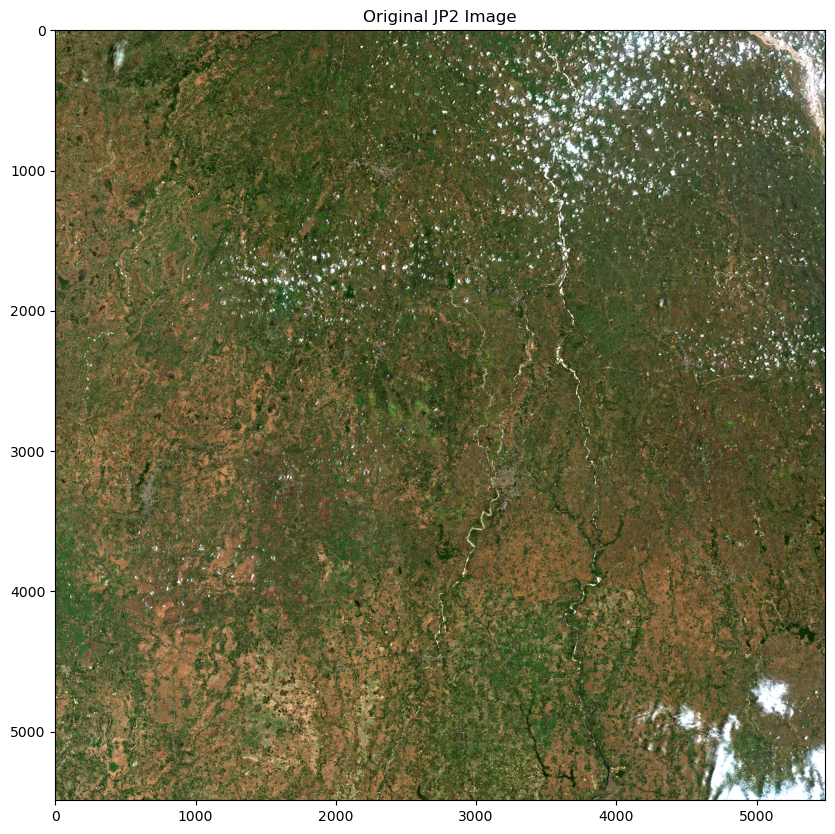

In [3]:
image_path2 = '/home/fahim/Downloads/S2A_MSIL1C_20240707T043701_N0510_R033_T45RXJ_20240707T071125 (2).SAFE/new satellite image dinajpur/S2B_MSIL2A_20240602T043659_N0510_R033_T45RXJ_20240602T065959.SAFE/GRANULE/L2A_T45RXJ_A037811_20240602T044729/IMG_DATA/R20m/T45RXJ_20240602T043659_TCI_20m.jp2'
with rasterio.open(image_path2) as src:
    image2 = src.read()

plt.figure(figsize=(10, 10))
plt.imshow(image2.transpose(1, 2, 0))
plt.title('Original JP2 Image')
plt.show()

In [4]:
image2 = image2.astype(np.float32) / 255.0
print("Image range after normalization:", image2.min(), image2.max())

Image range after normalization: 0.0 1.0


Metadata: {'driver': 'JP2OpenJPEG', 'dtype': 'uint8', 'nodata': None, 'width': 5490, 'height': 5490, 'count': 3, 'crs': CRS.from_epsg(32645), 'transform': Affine(20.0, 0.0, 600000.0,
       0.0, -20.0, 2900040.0)}


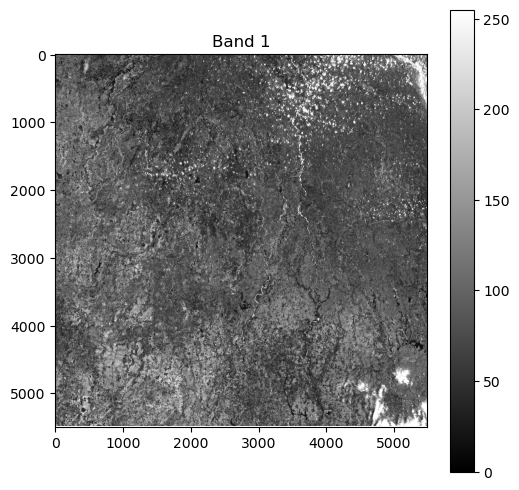

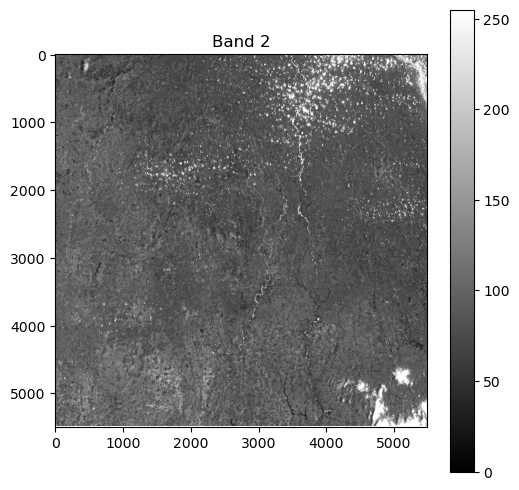

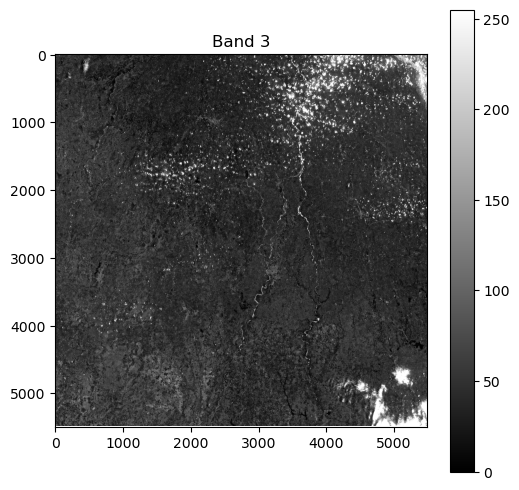

In [5]:
with rasterio.open(image_path2) as src:
    metadata2 = src.meta
    print("Metadata:", metadata2)

    for band2 in range(1, src.count + 1):
        band_data2 = src.read(band2)
        plt.figure(figsize=(6, 6))
        plt.imshow(band_data2, cmap='gray')
        plt.title(f'Band {band2}')
        plt.colorbar()
        plt.show()

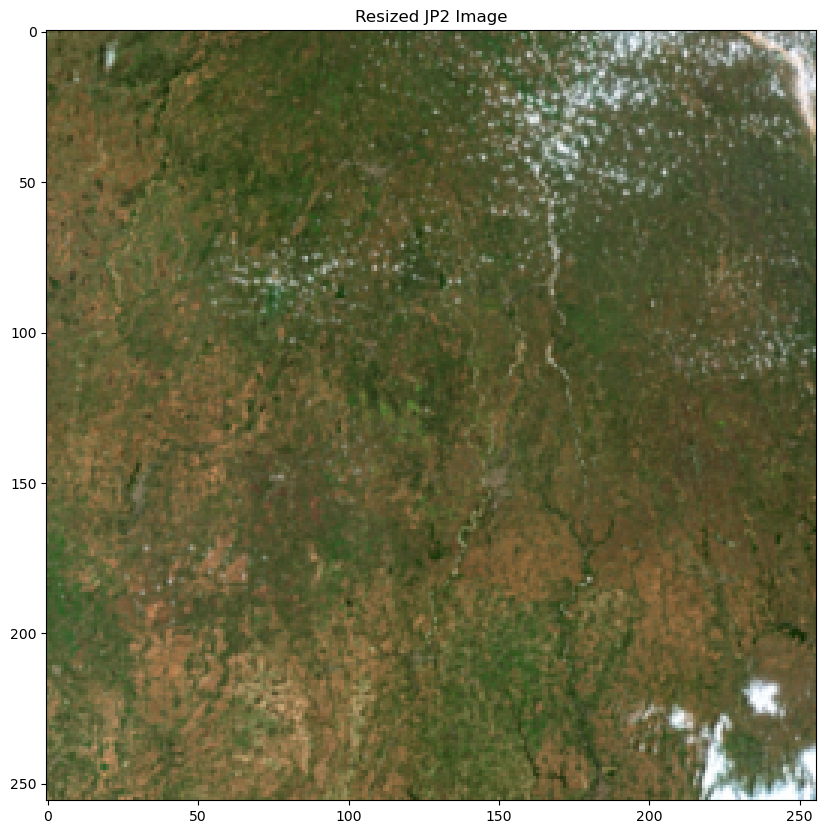

In [6]:
def resize_image_skimage(image2, size=(256, 256)):
    bands2, height2, width2 = image2.shape
    resized_image2 = np.zeros((bands2, size[0], size[1]), dtype=image2.dtype)
    for i in range(bands2):
        resized_image2[i] = resize(image2[i], size, anti_aliasing=True)
    return resized_image2

image_resized2 = resize_image_skimage(image2, size=(256, 256))
plt.figure(figsize=(10, 10))
plt.imshow(image_resized2.transpose(1, 2, 0))
plt.title('Resized JP2 Image')
plt.show()

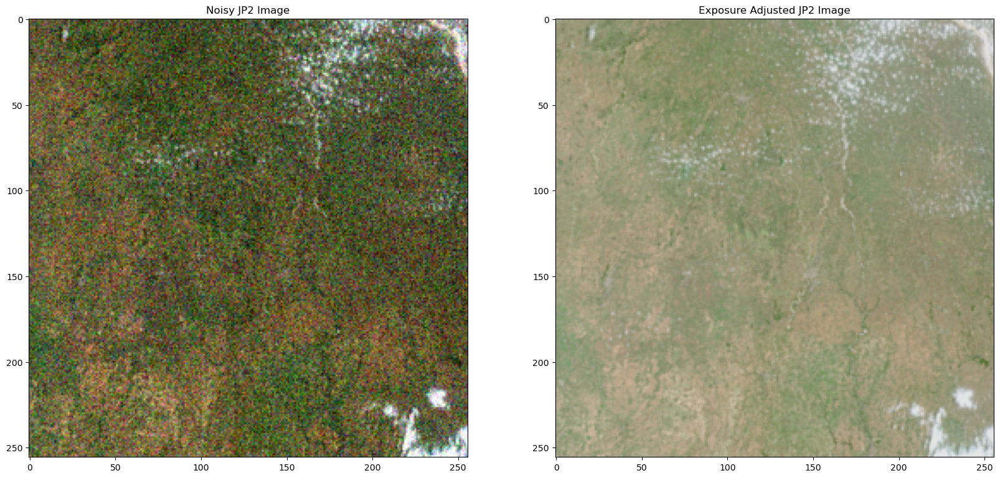

In [7]:
image_noisy2 = random_noise(image_resized2)
image_exposure2 = exposure.adjust_gamma(image_resized2, gamma=0.4, gain=0.9)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image_noisy2.transpose(1, 2, 0))
ax[0].set_title('Noisy JP2 Image')
ax[1].imshow(image_exposure2.transpose(1, 2, 0))
ax[1].set_title('Exposure Adjusted JP2 Image')
plt.show()

In [9]:
image_flattened2 = image_resized2.reshape(-1, 256*256*image_resized2.shape[0])
X_train, X_test, y_train, y_test = image_flattened2, image_flattened2, [0], [0]

## 20m Single photo test train

In [10]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", len(y_train))
print("y_test shape:", len(y_test))

X_train shape: (1, 196608)
X_test shape: (1, 196608)
y_train shape: 1
y_test shape: 1


## True Color Index_20m

In [11]:
def load_image(file_path2):
    with rasterio.open(file_path2) as src:
        image2 = src.read()
    return image2

In [29]:
def extract_patches(image_1, patch_size=(256, 256)):
    patches2 = []
    height2, width2 = image2.shape[1], image2.shape[2]
    for i in range(0, height2, patch_size[0]):
        for j in range(0, width2, patch_size[1]):
            patch2 = image2[:, i:i+patch_size[0], j:j+patch_size[1]]
            if patch2.shape[1] == patch_size[0] and patch2.shape[2] == patch_size[1]:
                patches2.append(patch2)
    return np.array(patches2)

In [30]:
patches2 = extract_patches(image2, patch_size=(256, 256))

## 20m Single photo split into fragments/patches for test train

In [33]:
labels2 = np.random.randint(0, 2, size=(len(patches2),))
X_train, X_test, y_train, y_test = train_test_split(patches2, labels2, test_size=0.2, train_size=0.8)
print(f'Train set size: {X_train.shape[0]}, Test set size: {X_test.shape[0]}')

Train set size: 352, Test set size: 89


## True Color Index_60m

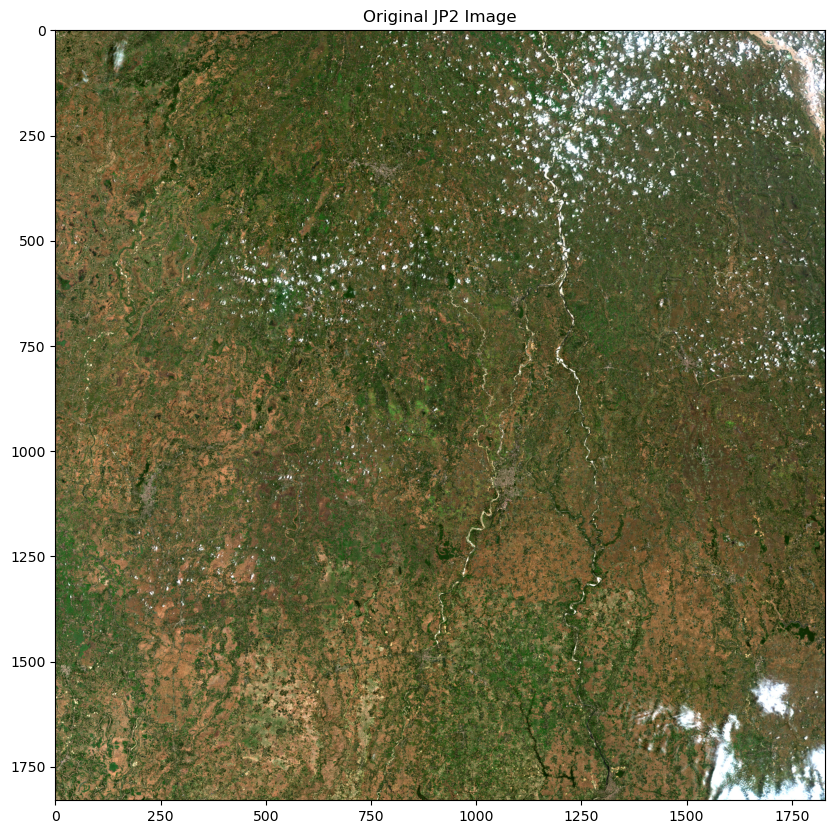

In [34]:
image_path3 = '/home/fahim/Downloads/S2A_MSIL1C_20240707T043701_N0510_R033_T45RXJ_20240707T071125 (2).SAFE/new satellite image dinajpur/S2B_MSIL2A_20240602T043659_N0510_R033_T45RXJ_20240602T065959.SAFE/GRANULE/L2A_T45RXJ_A037811_20240602T044729/IMG_DATA/R60m/T45RXJ_20240602T043659_TCI_60m.jp2'
with rasterio.open(image_path3) as src:
    image3 = src.read()

plt.figure(figsize=(10, 10))
plt.imshow(image3.transpose(1, 2, 0))
plt.title('Original JP2 Image')
plt.show()

In [35]:
image3 = image3.astype(np.float32) / 255.0
print("Image range after normalization:", image3.min(), image3.max())

Image range after normalization: 0.0 1.0


Metadata: {'driver': 'JP2OpenJPEG', 'dtype': 'uint8', 'nodata': None, 'width': 1830, 'height': 1830, 'count': 3, 'crs': CRS.from_epsg(32645), 'transform': Affine(60.0, 0.0, 600000.0,
       0.0, -60.0, 2900040.0)}


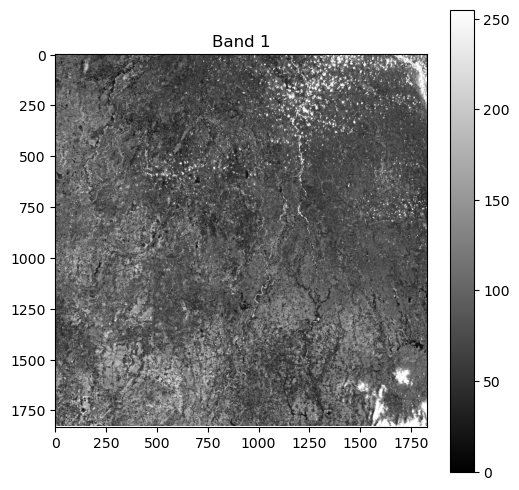

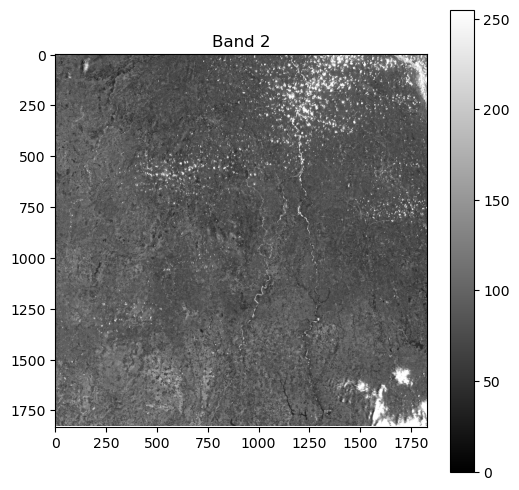

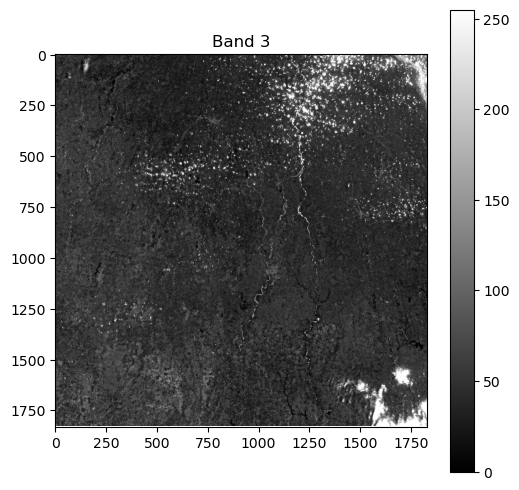

In [37]:
with rasterio.open(image_path3) as src:
    metadata3 = src.meta
    print("Metadata:", metadata3)

    for band3 in range(1, src.count + 1):
        band_data3 = src.read(band3)
        plt.figure(figsize=(6, 6))
        plt.imshow(band_data3, cmap='gray')
        plt.title(f'Band {band3}')
        plt.colorbar()
        plt.show()

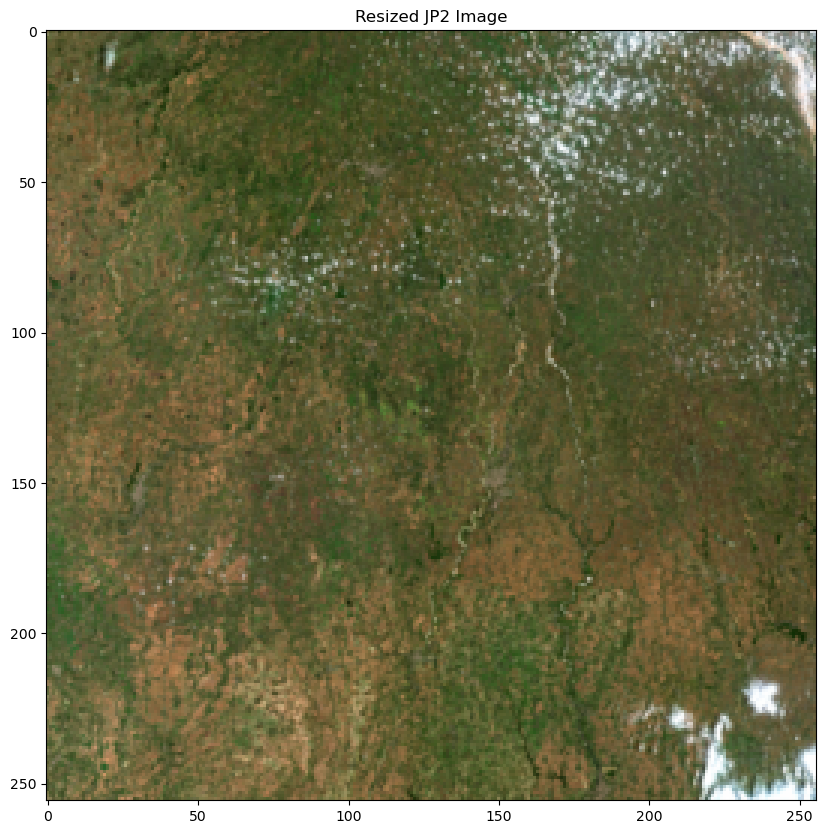

In [38]:
def resize_image_skimage(image3, size=(256, 256)):
    bands3, height3, width3 = image3.shape
    resized_image3 = np.zeros((bands3, size[0], size[1]), dtype=image3.dtype)
    for i in range(bands3):
        resized_image3[i] = resize(image3[i], size, anti_aliasing=True)
    return resized_image3

image_resized3 = resize_image_skimage(image3, size=(256, 256))
plt.figure(figsize=(10, 10))
plt.imshow(image_resized3.transpose(1, 2, 0))
plt.title('Resized JP2 Image')
plt.show()

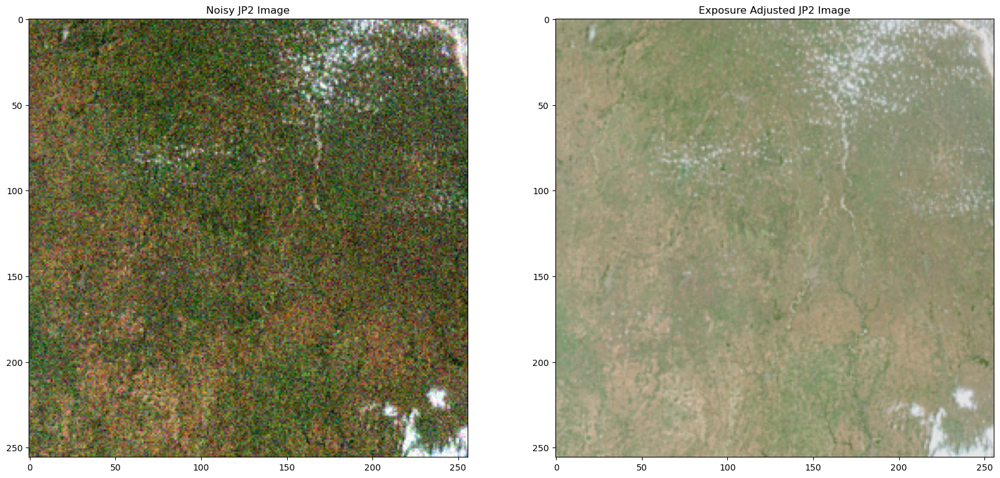

In [39]:
image_noisy3 = random_noise(image_resized3)
image_exposure3 = exposure.adjust_gamma(image_resized3, gamma=0.4, gain=0.9)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image_noisy3.transpose(1, 2, 0))
ax[0].set_title('Noisy JP2 Image')
ax[1].imshow(image_exposure3.transpose(1, 2, 0))
ax[1].set_title('Exposure Adjusted JP2 Image')
plt.show()

In [40]:
image_flattened3 = image_resized3.reshape(-1, 256*256*image_resized2.shape[0])
X_train, X_test, y_train, y_test = image_flattened3, image_flattened3, [0], [0]

## 60m Single photo test train

In [41]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", len(y_train))
print("y_test shape:", len(y_test))

X_train shape: (1, 196608)
X_test shape: (1, 196608)
y_train shape: 1
y_test shape: 1


## True Color Index_60m

In [43]:
def load_image(file_path3):
    with rasterio.open(file_path3) as src:
        image3 = src.read()
    return image3

In [44]:
def extract_patches(image_1, patch_size=(256, 256)):
    patches3 = []
    height3, width3 = image3.shape[1], image3.shape[2]
    for i in range(0, height3, patch_size[0]):
        for j in range(0, width3, patch_size[1]):
            patch3 = image3[:, i:i+patch_size[0], j:j+patch_size[1]]
            if patch3.shape[1] == patch_size[0] and patch3.shape[2] == patch_size[1]:
                patches3.append(patch3)
    return np.array(patches3)

In [45]:
patches3 = extract_patches(image3, patch_size=(256, 256))

## 60m Single photo split into fragments/patches for test train

In [46]:
labels3 = np.random.randint(0, 2, size=(len(patches3),))
X_train, X_test, y_train, y_test = train_test_split(patches3, labels3, test_size=0.2, train_size=0.8)
print(f'Train set size: {X_train.shape[0]}, Test set size: {X_test.shape[0]}')

Train set size: 39, Test set size: 10
